In [152]:
from glob import glob
from PIL import Image
from resizeimage import resizeimage
import numpy as np
from skimage.io import imread_collection
import matplotlib.pyplot as plt


# create paths for all images
photos = glob('photos/*')
#store the collection
photos_collect = imread_collection(photos)

photos_resize = []
photo_flattened = []

# for each image path
for path in photos:
    # open it as a read file in binary mode
    with open(path, 'r+b') as f:
        # open it as an image
        with Image.open(f) as image:
            # resize the image to be more manageable
            cover = resizeimage.resize_cover(image, [400, 300])
            photos_resize.append(cover)
            # flatten the matrix to an array and append it to all flattened images
            photo_flattened.append(np.array(cover).flatten())            

# Change datatype to an array
X = np.asarray(photo_flattened)

In [153]:
np.array(cover).shape, X.shape

((300, 400, 4), (24, 480000))

`np.array(cover)`: For a specific image, there is a two-dimensional array of shape (h, w, 4), with h the number of pixels high (up and down), and w the number of pixels across (left to right).

`X`: Flatten data for all images, (24, 480000) means that there are are 24 images, and the 480000 comes from 300 * 400 * 4 after flattening. 


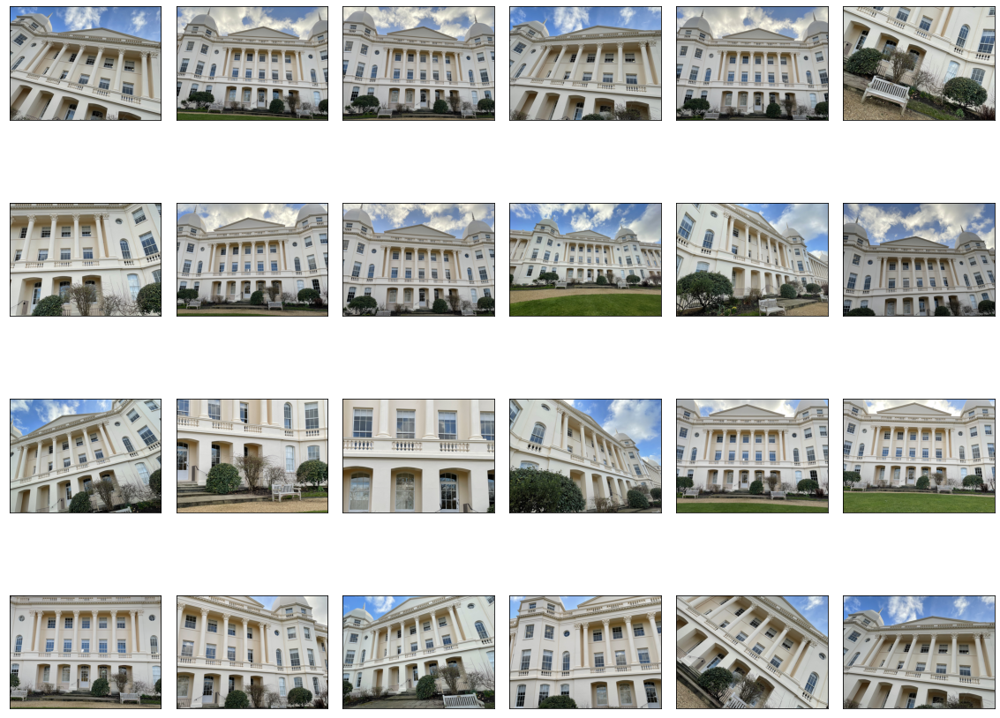

In [154]:
#plot the photos 
def original_photos(photos_resize):
    fig, ax = plt.subplots(4, 6, figsize=(20, 16),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))

    k = 0
    for i in range(4):
        for j in range(6):
            ax[i, j].imshow(photos_resize[k])
            k += 1
            
    plt.show()
original_photos(photos_resize)          

In [155]:
X.shape

(24, 480000)

Text(0, 0.5, 'Explained variance')

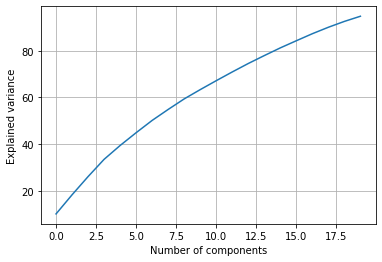

In [156]:
from sklearn.decomposition import PCA
# Use 20 components to see explained variance 
pca_20 = PCA(n_components=20)
pca_20.fit(X)

plt.grid()
plt.plot(np.cumsum(pca_20.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

In [157]:
#Explained variance ratio with numbers of components

import pandas as pd
explained_var = np.cumsum(pca_20.explained_variance_ratio_ * 100).reshape(-1, 1)
num_comps = [i+1 for i in range(20)]
explained_var
explained_var_df = pd.DataFrame(explained_var,index=num_comps, columns = ['Explained Variance Ratio'])
explained_var_df

,Explained Variance Ratio
1,10.122356
2,18.305034
3,26.098938
4,33.484978
5,39.410608
6,44.886048
7,50.147804
8,54.842463
9,59.354870
10,63.322900


In [158]:

import pandas as pd

def PCA_components(X, n): 
    pca = PCA(n_components=n)
    principalComponents = pca.fit_transform(X)
    return principalComponents, pca

principalComponents_2, pca_2 = PCA_components(X, 2)

Visually inspect the 2D locations of each photo in the new space

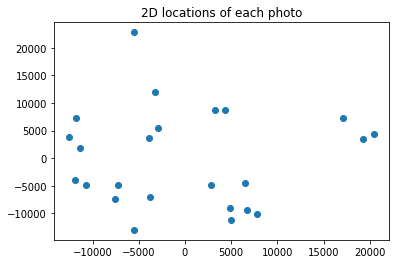

In [159]:
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.title('2D locations of each photo')
plt.show()

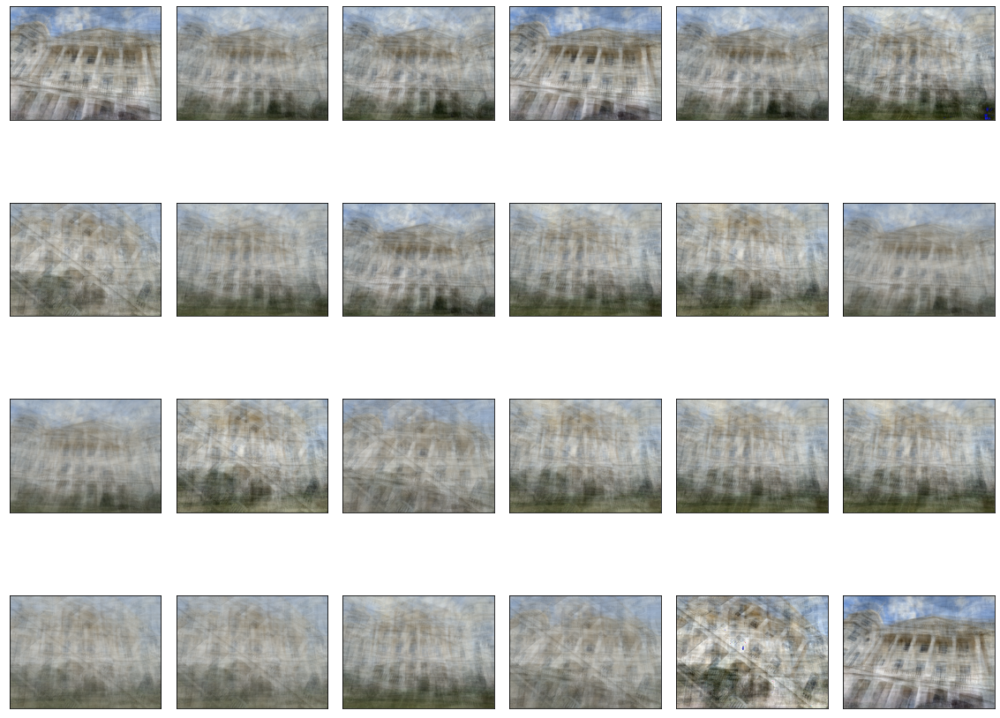

In [160]:
def reconstruction(principalComponents, pca):
    X_inv = pca.inverse_transform(principalComponents)

    X_inv = np.reshape(X_inv,(24,300, 400, 4))

    #create the photos
    fig, ax = plt.subplots(4, 6, figsize=(20, 16),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
    k = 0
    for i in range(4):
        for j in range(6):
            image_proj = X_inv[k,:]
            ax[i, j].imshow((image_proj).astype(np.uint8))
            k += 1
    plt.show()
reconstruction(principalComponents_2, pca_2)

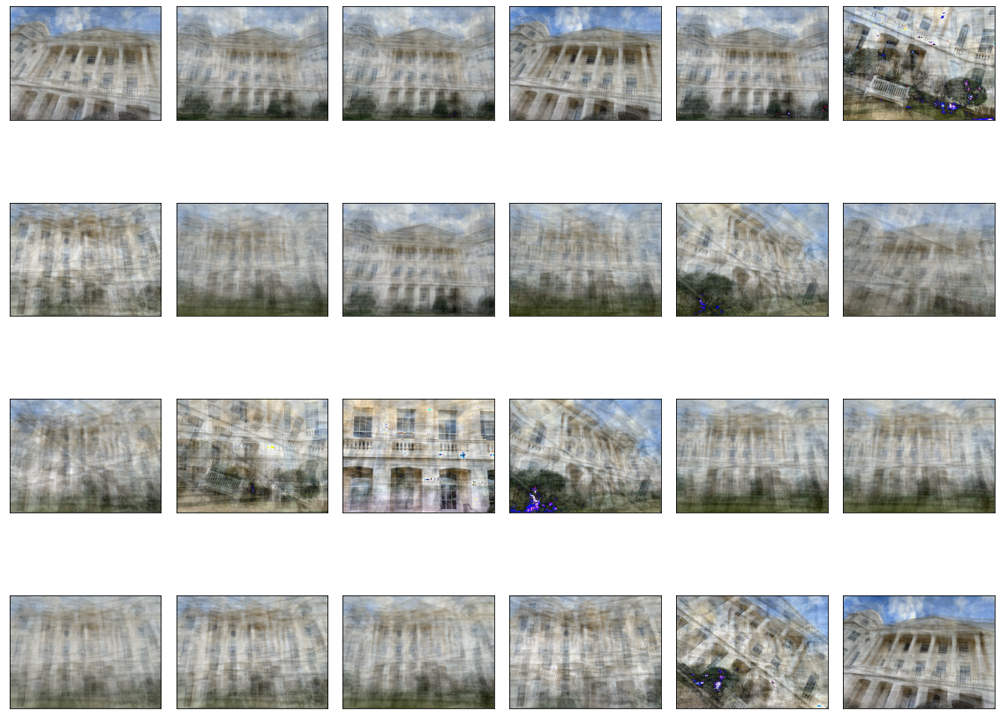

In [161]:
#Test 5 principle componenet
principalComponents_5, pca_5 = PCA_components(X, 5)
reconstruction(principalComponents_5, pca_5)

When there are only 2 components, we expect it to be really bad because it only explain 18.305% of the variance. We can also see that the reconstruction is drastically improved when we have 5 components, constituting 39% of the variance. 
We can also see that the algorithms migh have confused due to the different angles because the lines intersects with each others like a cross. 

### Pick a point that is far away from any known location and plot its reconstruction


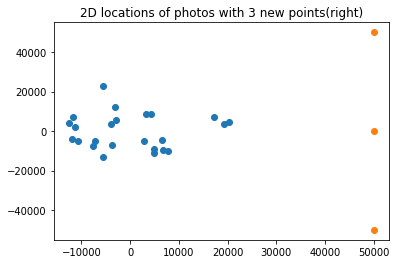

In [162]:
new_1 = np.array([[50000, -50000],[50000, 0],[50000, 50000]])
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.scatter(new_1[:, 0], new_1[:, 1])
plt.title('2D locations of photos with 3 new points(right)')
plt.show()

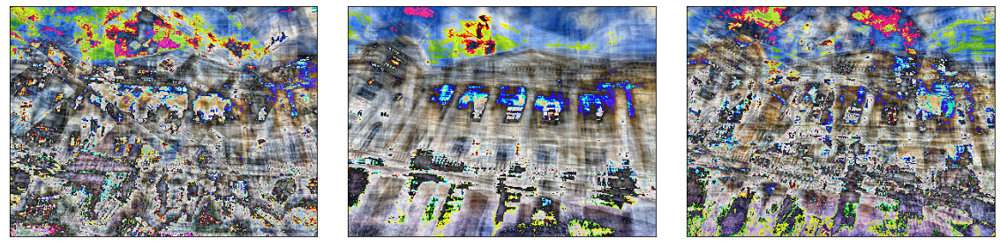

In [163]:
# Reconstruct new points 
def reconstruction_new(principalComponents, pca):
    X_inv = pca.inverse_transform(principalComponents)

    X_inv = np.reshape(X_inv,(3,300, 400, 4))

    #create the photos
    fig, ax = plt.subplots(1, 3, figsize=(20, 16),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
    k = 0
    for i in range(3):
        image_proj = X_inv[k,:]
        ax[i].imshow((image_proj).astype(np.uint8))
        k += 1
    plt.show()

reconstruction_new(new_1, pca_2)

We see that the luminance and the brightness has been distorted when we project from a far location. Though we cannot conclude that what constitute the components because it's a combination of elements that are calculated by the machine, we can see that the color(luminance and the brightness) might have played an important role for the x axis components in the computation. 

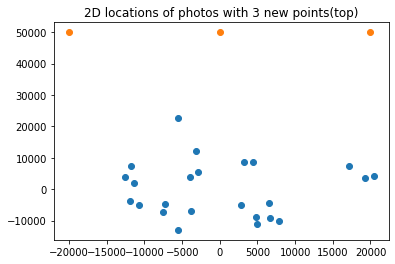

In [164]:
#More new points 
new_2 = np.array([[-20000, 50000],[0, 50000],[20000, 50000]])
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.scatter(new_2[:, 0], new_2[:, 1])
plt.title('2D locations of photos with 3 new points(top)')
plt.show()

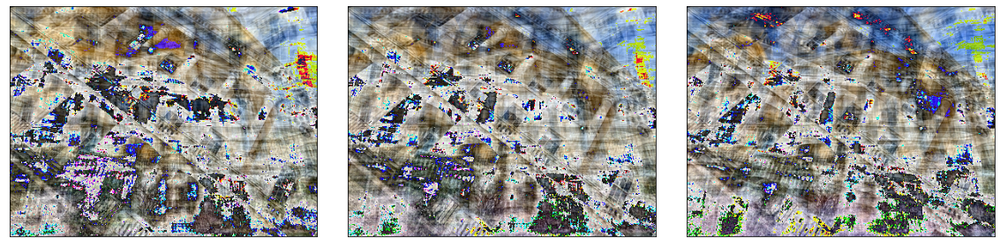

In [165]:
reconstruction_new(new_2, pca_2)

When we projecting from the top, we see that the sky is covered, and the crossed lines become even more salient. We might interpret the y axis components in the computation affect the position, and the angle. 

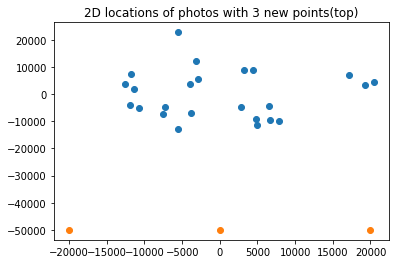

In [166]:
#More new points 
new_3 = np.array([[-20000, -50000],[0, -50000],[20000, -50000]])
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.scatter(new_3[:, 0], new_3[:, 1])
plt.title('2D locations of photos with 3 new points(top)')
plt.show()

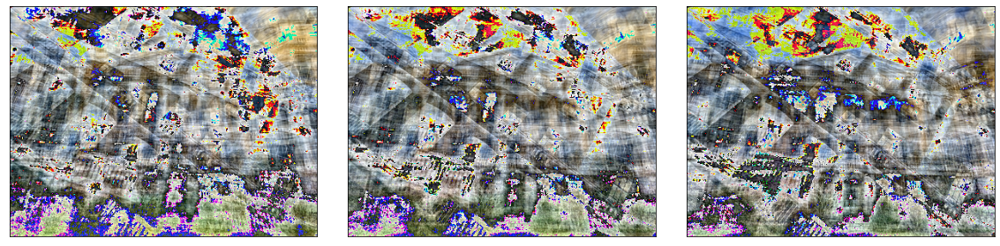

In [167]:
reconstruction_new(new_3, pca_2)

We confirm our assumption by projecting from the bottom location, which we can see that the the proportion of sky becomes slightly bigger even though the cross line is still obvious.

## Another Photo set

In order to mitigate the bias coming from big angle change, we select another photo set that only varies smaller angles to experinment.

In [168]:
# create paths for all images
photos = glob('photos_2/*')
#store the collection
photos_collect = imread_collection(photos)

photos_resize = []
photo_flattened = []

# for each image path
for path in photos:
    # open it as a read file in binary mode
    with open(path, 'r+b') as f:
        # open it as an image
        with Image.open(f) as image:
            # resize the image to be more manageable
            cover = resizeimage.resize_cover(image, [400, 300])
            photos_resize.append(cover)
            # flatten the matrix to an array and append it to all flattened images
            photo_flattened.append(np.array(cover).flatten())            

# Change datatype to an array
X = np.asarray(photo_flattened)

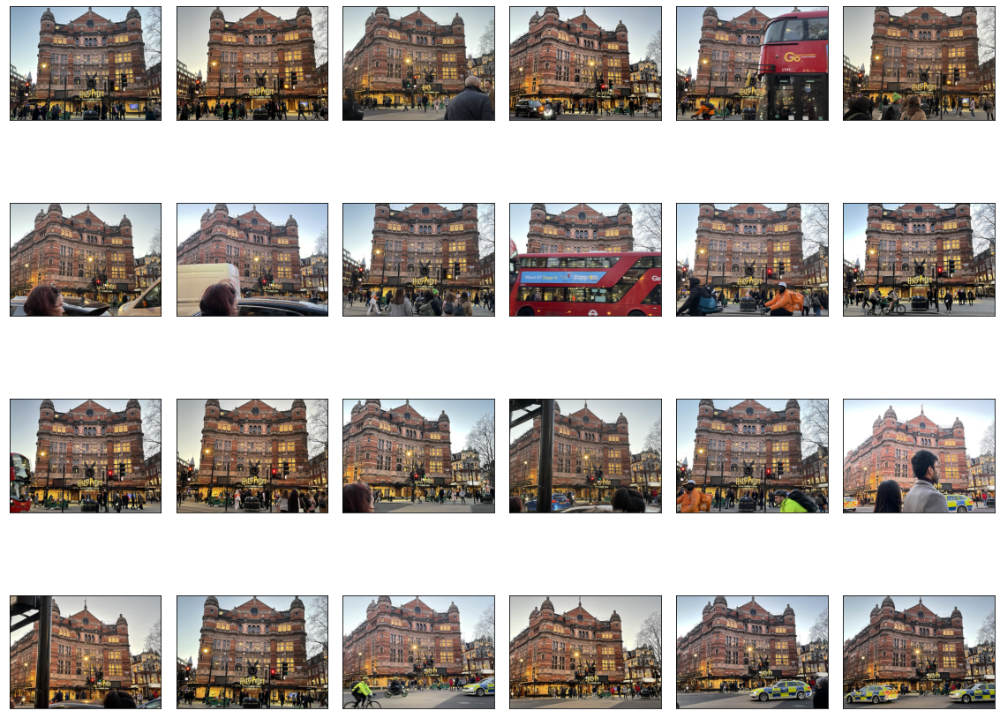

In [169]:
original_photos(photos_resize)  

Text(0, 0.5, 'Explained variance')

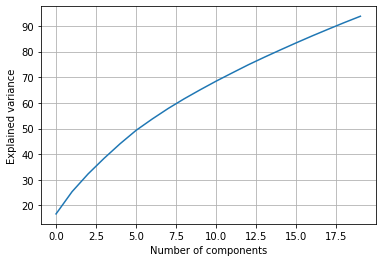

In [170]:
from sklearn.decomposition import PCA
# Use 20 components to see explained variance 
pca_20 = PCA(n_components=20)
pca_20.fit(X)

plt.grid()
plt.plot(np.cumsum(pca_20.explained_variance_ratio_ * 100))
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

In [171]:
#Explained variance ratio with numbers of components

import pandas as pd
explained_var = np.cumsum(pca_20.explained_variance_ratio_ * 100).reshape(-1, 1)
num_comps = [i+1 for i in range(20)]
explained_var
explained_var_df = pd.DataFrame(explained_var,index=num_comps, columns = ['Explained Variance Ratio'])
explained_var_df

,Explained Variance Ratio
1,16.718209
2,25.386740
3,32.303151
4,38.398348
5,44.082390
6,49.305756
7,53.693244
8,57.816906
9,61.591804
10,65.110341


In comparison to the previous photos set, we can see that the explained variance ratio increases. To be specific, the Explained Variance Ratio in the previous photo set vs. the current photo set: 
- One component: 10.12% vs. 16.72%
- Two components: 18.30% vs. 25.38%
- Three components: 26.09% vs. 32.30%

In [172]:

import pandas as pd

def PCA_components(X, n): 
    pca = PCA(n_components=n)
    principalComponents = pca.fit_transform(X)
    return principalComponents, pca

principalComponents_2, pca_2 = PCA_components(X, 2)

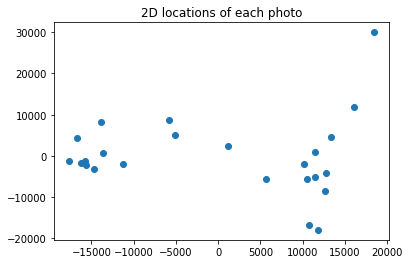

In [173]:
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.title('2D locations of each photo')
plt.show()

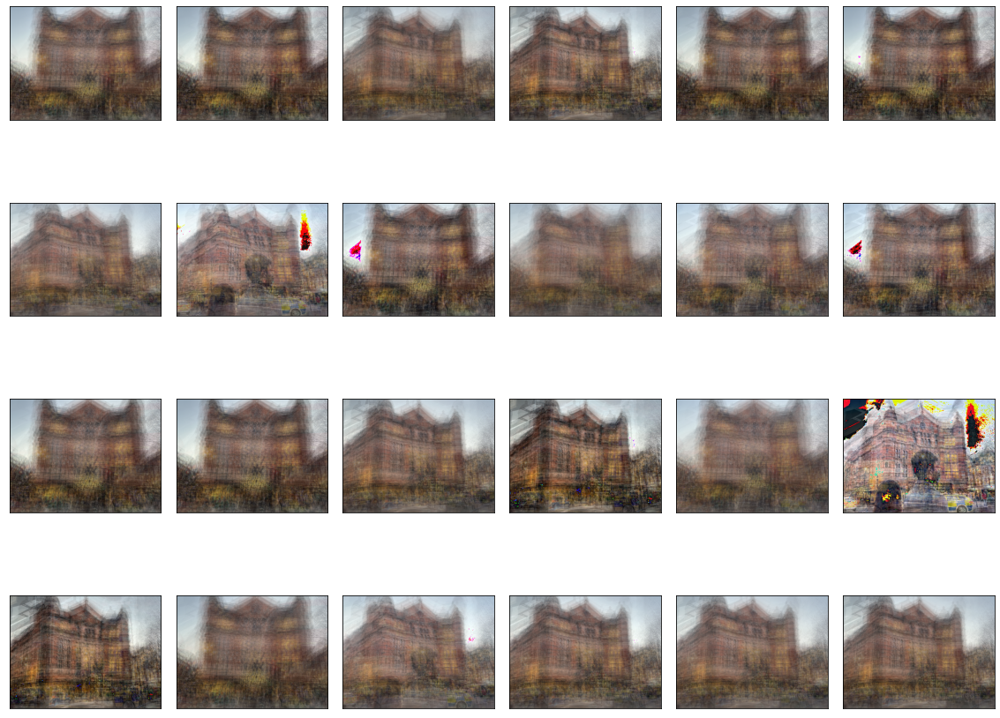

In [174]:
reconstruction(principalComponents_2, pca_2)

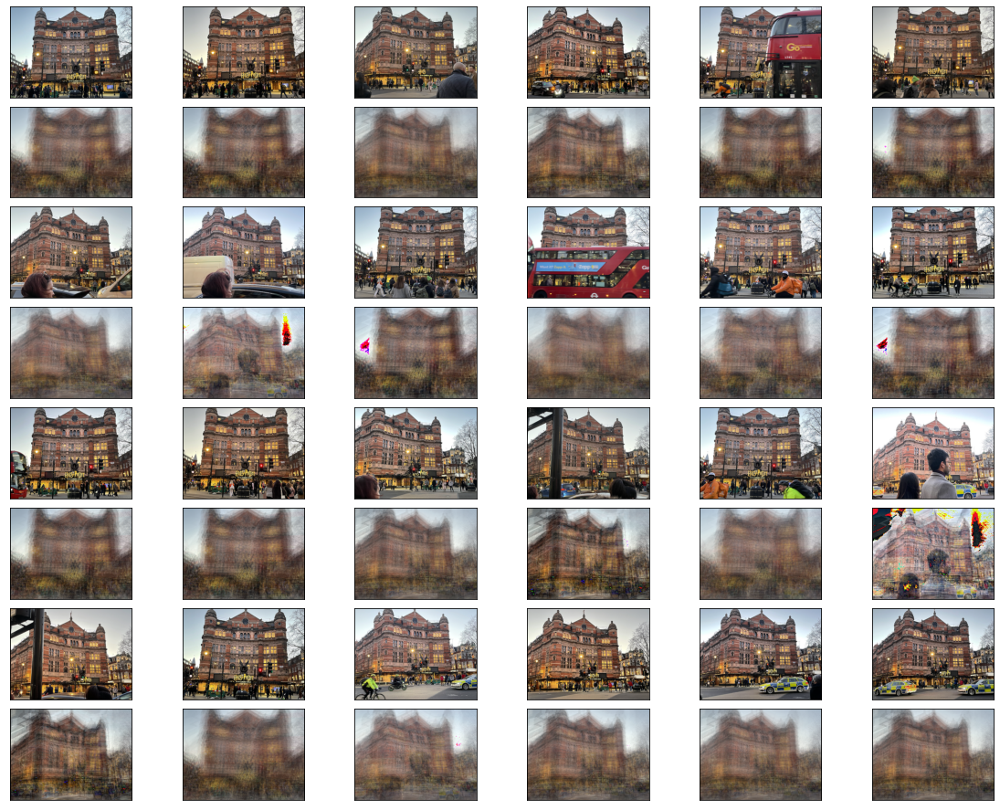

In [175]:
def reconstruction_comparison(principalComponents, pca, photos_resize):
    X_inv = pca.inverse_transform(principalComponents)

    X_inv = np.reshape(X_inv,(24,300, 400, 4))

    #create the photos
    fig, ax = plt.subplots(8, 6, figsize=(20, 16),
                       subplot_kw={'xticks':[], 'yticks':[]},
                       gridspec_kw=dict(hspace=0.1, wspace=0.1))
    k = 0
    for i in range(0,8,2):
        for j in range(6):
            image_proj = X_inv[k,:]
            ax[i, j].imshow(photos_resize[k])
            ax[i+1, j].imshow((image_proj).astype(np.uint8))
            k += 1
    plt.show()
reconstruction_comparison(principalComponents_2, pca_2, photos_resize)       

From the reconstruction, we can see that the man in grey suit (the code block below) strongly affects the image reconstruction, because we can see his ghost head everywhere in other reconstructed pictures. For the red bus, we can see some darker shades at the right bottom corner. showcasing the effect of it still exists though not visible enough to make the bus identifiable. In addition, we observe that if pedestrian exists in the photo, the lower half of the reconstruction is messier than other photos. 

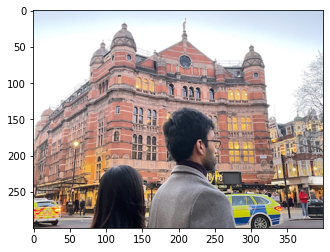

In [176]:
#The outlier man in the photo 
plt.imshow(photos_resize[17])

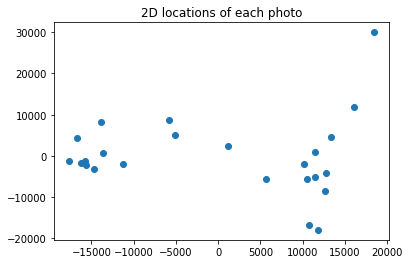

In [177]:
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.title('2D locations of each photo')
plt.show()

We see that more cluster exists in this photo set. It might because I take a several photos from the same angle that forms the cluster. 

### Project from a far away space

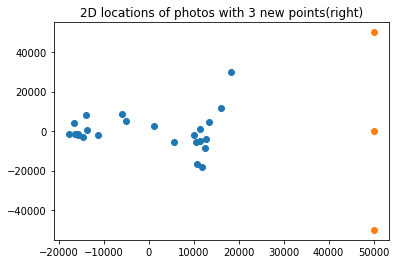

In [178]:
new_1 = np.array([[50000, -50000],[50000, 0],[50000, 50000]])
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.scatter(new_1[:, 0], new_1[:, 1])
plt.title('2D locations of photos with 3 new points(right)')
plt.show()

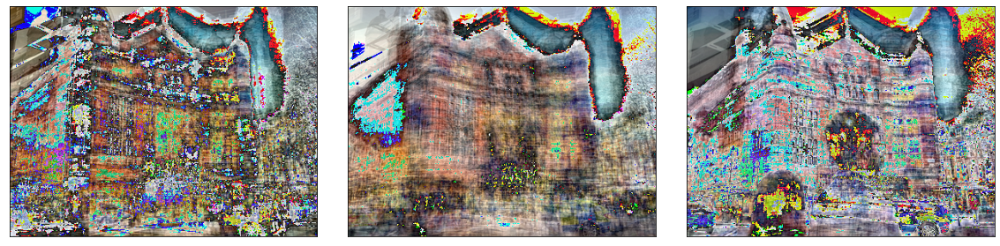

In [179]:
reconstruction_new(new_1, pca_2)

Similarly, we see that color is still the major factor when we find a far away location. The blue chunk of code might due to the component related to the exposure of the sunlight. 

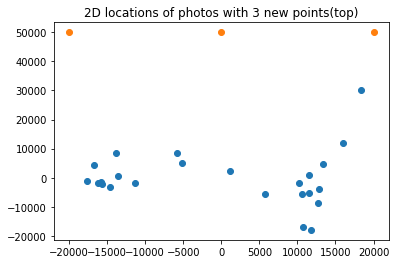

In [180]:
#More new points 
new_2 = np.array([[-20000, 50000],[0, 50000],[20000, 50000]])
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.scatter(new_2[:, 0], new_2[:, 1])
plt.title('2D locations of photos with 3 new points(top)')
plt.show()

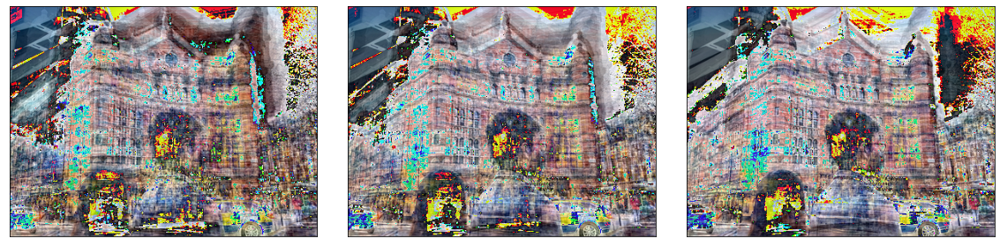

In [181]:
reconstruction_new(new_2, pca_2)

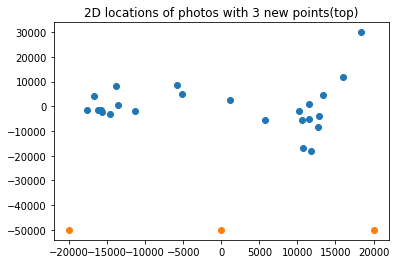

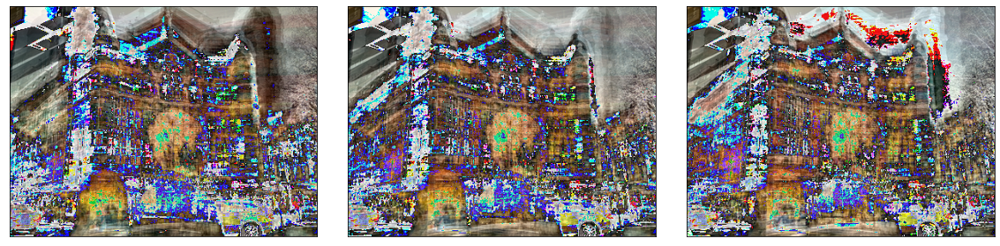

In [182]:
#More new points 
new_3 = np.array([[-20000, -50000],[0, -50000],[20000, -50000]])
plt.scatter(principalComponents_2[:, 0], principalComponents_2[:, 1])
plt.scatter(new_3[:, 0], new_3[:, 1])
plt.title('2D locations of photos with 3 new points(top)')
plt.show()

reconstruction_new(new_3, pca_2)

We can see that regardless the projection coming from the bottom or the top, image is heavily distorted. The frame of the building become very blurry. However, we can see the bottom photo is significantly darker than the upper one. It might indicate that the y axis control the intensity of the light.   

## Channel of an image 

shape = (width, height, channel)
4 channel exists 
The three columns are often the red, green and blue channels. With four channels, it is often an alpha channel that specifies the opaque level of that pixel.

`np.reshape(X_inv,(24,300, 400, 4))`
`resize_cover(image, [400, 300])`

https://towardsdatascience.com/how-to-resize-images-using-python-8aaba74602ed

Link 
https://analyticsindiamag.com/guide-to-image-reconstruction-using-principal-component-analysis/
https://shankarmsy.github.io/posts/pca-sklearn.html
